In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import imageio
import folium
import folium.plugins as plugins
# ! pip install mpl_toolkits
# ! conda install basemap
# ! conda install -c conda-forge basemap
# Solving environment: done
from mpl_toolkits.basemap import Basemap
# !python -m pip install basemap-data
# !python -m pip install basemap-data-hires
# !python -m pip install basemap
# ! conda install folium -c conda-forge
# ! pip install folium
# ! pip install pyecharts -U
from pyecharts import options as opts
from pyecharts.charts import Map
from pyecharts.globals import ThemeType, CurrentConfig
from pyecharts.datasets import register_url
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
register_url("https://echarts-maps.github.io/echarts-countries-js/")
from pyecharts.charts import Geo
from pyecharts.globals import ChartType
from pyecharts.charts import BMap
from pyecharts.faker import Faker
from pyecharts.commons.utils import JsCode
from plotly import figure_factory as ff

In [2]:
business=pd.read_json("C:\\Users\\vjjh\\Desktop\\data science\\final project\\yelp_academic_dataset_business.json\\yelp_academic_dataset_business.json",lines=True,encoding="UTF-8")
business['state']=business['state'].apply(lambda x:"Alabama" if x=='AB' else "Arizona" if x=='AZ' else "California" if x=='CA' else "Colorado" if x=='CO' else "Delaware" if x=='DE' else "Florida" if x=='FL' else "Hawaii"if x=='HI'else 'Idaho'if x=='ID'else 'Illinois'if x=='IL'else'Indiana'if x=='IN'else 'Louisiana'if x=='LA'else 'Missouri'if x=='MO' else 'Montana'if x=='MT'else 'North Carolina'if x=='NC'else 'New Jersey'if x=='NJ'else 'Nevada' if x=='NV'else 'Pennsylvania'if x=='PA'else 'Tennessee' )
business.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,California,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,Missouri,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,Arizona,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,Pennsylvania,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,Pennsylvania,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


In [3]:
business.dtypes

business_id      object
name             object
address          object
city             object
state            object
postal_code      object
latitude        float64
longitude       float64
stars           float64
review_count      int64
is_open           int64
attributes       object
categories       object
hours            object
dtype: object

In [4]:
x=[None]*len(business['categories'])
for i in range(len(business['categories'])):
    if ("Restaurant" in str(business.loc[i,'categories'])):
        x[i]= True
    else :
        x[i]= False

business=business[x]
business=business.reset_index(drop=True)
business['popularity']=business['stars']*business['review_count']
# business_restaurant
business_groupby_city_top10=business.groupby(['city']).agg({"popularity":sum}).sort_values("popularity",ascending=False).head(10)
# business_groupby_city_top10=business_groupby_city.head(10)
business_groupby_city_top10=business_groupby_city_top10.reset_index()
business_groupby_city_top5=business_groupby_city_top10.head(5)
business_groupby_city_top6_10=business_groupby_city_top10.loc[5:10,:]

D:\E\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


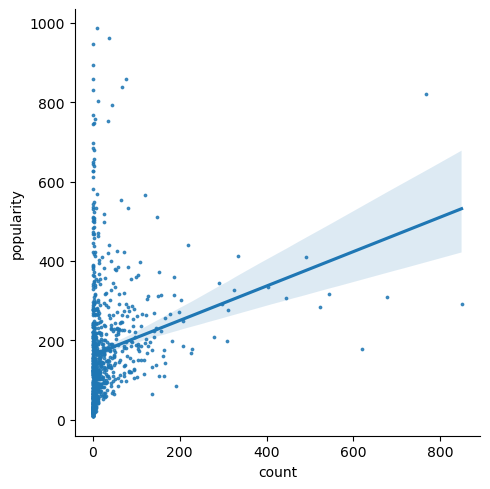

In [5]:
# business_groupby_city_top10
import scipy.stats as stats
# fig = plt.figure(figsize=(5, 4))
# axes = fig.add_axes([0, 0, 1, 1])
rest_count=business.city.value_counts().sort_index()
rest_average_popularity=business.groupby(['city']).agg({"popularity":np.mean}).sort_values("city")
rest_average_popularity['count']=rest_count
rest_average_popularity0=rest_average_popularity[(rest_average_popularity['popularity']<1000)&(rest_average_popularity['count']<1000)]
sns.lmplot('count','popularity',rest_average_popularity0,fit_reg=True,scatter_kws={"s": 3})
# slope, intercept, r_value, _, _ = stats.linregress(rest_count, rest_average_popularity)
# axes.text(50, 38000, "r = " + str(round(r_value, 3)))
# rest_average_popularity0.corr()



In [6]:
# state_review_count = business.groupby("city").sum("review_count")["review_count"].sort_values(ascending=False).head(20)
# state_review_count
# business
# business=business.reset_index(drop=True)
y=[None]*len(business['city'])
z=[None]*len(business['city'])
w=[None]*len(business['city'])
for i in range(len(business['city'])):
    if (business.loc[i,'city'] in business_groupby_city_top5['city'].values):
        y[i]= True
    else :
        y[i]= False
    if (business.loc[i,'city'] in business_groupby_city_top6_10['city'].values):
        z[i]= True
    else :
        z[i]= False
    if (business.loc[i,'city'] in business_groupby_city_top10['city'].values):
        w[i]= True
    else :
        w[i]= False

city_top5=business[y]
city_top6_10=business[z]
city_top10=business[w]
city_top10=city_top10.reset_index(drop=True)
city_top5=city_top5.reset_index(drop=True)
city_top6_10=city_top6_10.reset_index(drop=True)
city_top5["log10(popularity)"]=np.log10(city_top5['popularity'])
city_top6_10["log10(popularity)"]=np.log10(city_top6_10['popularity'])
city_top10["log10(popularity)"]=np.log10(city_top10['popularity'])

In [7]:
# city_top10.loc[0,'latitude']-city_top10.loc[1,'latitude']
# city_top1

In [28]:
city_top5['adj_count']=[0]*len(city_top5)
for i in range(len(city_top5)):
    for j in range(len(city_top5)):
        if (((city_top5.loc[i,'latitude']-city_top5.loc[j,'latitude'])**2)+((city_top5.loc[i,'longitude']-city_top5.loc[j,'longitude'])**2)<(0.0045**2)):
            city_top5.loc[i,'adj_count']+=1
city_top5.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,popularity,log10(popularity),adj_count
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,Pennsylvania,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",320.0,2.505150,247
1,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,Tennessee,37207,36.208102,-86.768170,1.5,10,1,"{'RestaurantsAttire': ''casual'', 'Restaurants...","Ice Cream & Frozen Yogurt, Fast Food, Burgers,...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-21:0', '...",15.0,1.176091,6
2,il_Ro8jwPlHresjw9EGmBg,Denny's,8901 US 31 S,Indianapolis,Indiana,46227,39.637133,-86.127217,2.5,28,1,"{'RestaurantsReservations': 'False', 'Restaura...","American (Traditional), Restaurants, Diners, B...","{'Monday': '6:0-22:0', 'Tuesday': '6:0-22:0', ...",70.0,1.845098,14
3,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,205 Race St,Philadelphia,Pennsylvania,19106,39.953949,-75.143226,4.0,245,1,"{'RestaurantsReservations': 'True', 'Restauran...","Sushi Bars, Restaurants, Japanese","{'Tuesday': '13:30-22:0', 'Wednesday': '13:30-...",980.0,2.991226,85
4,ROeacJQwBeh05Rqg7F6TCg,BAP,1224 South St,Philadelphia,Pennsylvania,19147,39.943223,-75.162568,4.5,205,1,"{'NoiseLevel': 'u'quiet'', 'GoodForMeal': '{'d...","Korean, Restaurants","{'Monday': '11:30-20:30', 'Tuesday': '11:30-20...",922.5,2.964966,94


In [34]:
city_top5.to_json(path_or_buf="C:\\Users\\vjjh\\Desktop\\data science\\final project\\adj_count.json")

In [36]:
ct5=pd.read_json("adj_count.json")
ct5

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,popularity,log10(popularity),adj_count
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,Pennsylvania,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",320.0,2.505150,247
1,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,Tennessee,37207,36.208102,-86.768170,1.5,10,1,"{'RestaurantsAttire': ''casual'', 'Restaurants...","Ice Cream & Frozen Yogurt, Fast Food, Burgers,...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-21:0', '...",15.0,1.176091,6
2,il_Ro8jwPlHresjw9EGmBg,Denny's,8901 US 31 S,Indianapolis,Indiana,46227,39.637133,-86.127217,2.5,28,1,"{'RestaurantsReservations': 'False', 'Restaura...","American (Traditional), Restaurants, Diners, B...","{'Monday': '6:0-22:0', 'Tuesday': '6:0-22:0', ...",70.0,1.845098,14
3,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,205 Race St,Philadelphia,Pennsylvania,19106,39.953949,-75.143226,4.0,245,1,"{'RestaurantsReservations': 'True', 'Restauran...","Sushi Bars, Restaurants, Japanese","{'Tuesday': '13:30-22:0', 'Wednesday': '13:30-...",980.0,2.991226,85
4,ROeacJQwBeh05Rqg7F6TCg,BAP,1224 South St,Philadelphia,Pennsylvania,19147,39.943223,-75.162568,4.5,205,1,"{'NoiseLevel': 'u'quiet'', 'GoodForMeal': '{'d...","Korean, Restaurants","{'Monday': '11:30-20:30', 'Tuesday': '11:30-20...",922.5,2.964966,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16435,gPr1io7ks0Eo3FDsnDTYfg,Tata Cafe,7201 Germantown Ave,Philadelphia,Pennsylvania,19119,40.060414,-75.191084,4.0,21,0,"{'RestaurantsGoodForGroups': 'True', 'Business...","Sandwiches, Restaurants, Italian","{'Monday': '7:0-17:0', 'Tuesday': '7:0-17:0', ...",84.0,1.924279,35
16436,wVxXRFf10zTTAs11nr4xeA,PrimoHoagies,6024 Ridge Ave,Philadelphia,Pennsylvania,19128,40.032483,-75.214430,3.0,55,1,"{'NoiseLevel': 'u'average'', 'RestaurantsTakeO...","Restaurants, Specialty Food, Food, Sandwiches,...","{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0'...",165.0,2.217484,38
16437,8n93L-ilMAsvwUatarykSg,Kitchen Gia,3716 Spruce St,Philadelphia,Pennsylvania,19104,39.951018,-75.198240,3.0,22,0,"{'RestaurantsGoodForGroups': 'True', 'BikePark...","Coffee & Tea, Food, Sandwiches, American (Trad...","{'Monday': '9:0-19:30', 'Tuesday': '9:0-19:30'...",66.0,1.819544,69
16438,2MAQeAqmD8enCT2ZYqUgIQ,The Melting Pot - Nashville,"166 2nd Ave N, Ste A",Nashville,Tennessee,37201,36.163875,-86.776311,4.0,204,0,"{'RestaurantsDelivery': 'False', 'RestaurantsR...","Fondue, Beer, Wine & Spirits, Food, Restaurants","{'Monday': '0:0-0:0', 'Tuesday': '16:0-21:0', ...",816.0,2.911690,189


In [29]:
sns.set(font_scale=1)
# your code here
sns.jointplot(data=city_top5,x='adj_count',y='popularity', s=4,hue='city')
sns.lmplot('adj_count','popularity',city_top5,hue="city",fit_reg=True,scatter_kws={"s": 3})

D:\E\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



In [10]:
business_byState=business.groupby(['state']).agg({"popularity":sum})
business_byState=business_byState.reset_index()
# business_byState
#

In [11]:
pairs=[]
for i in range(18):
    pairs.append((business_byState.loc[i,'state'],business_byState.loc[i,'popularity']))

# pairs.append(('Alaska',0))
# pairs.append(('Arkansas',0))
# pairs.append(('Connecticut',0))
# pairs.append(('Georgia',0))
# pairs.append(('Iowa',0))
# pairs.append(('Kansas',0))
# pairs.append(('Kentucky',0))
# pairs.append(('Maine',0))
# pairs.append(('Maryland',0))
# pairs.append(("Massachusetts",0))
# pairs.append(('Michigan',0))
# pairs.append(('Minnesota',0))
# pairs.append(("Mississippi",0))
# pairs.append(('Nebraska',0))
# pairs.append(('New Hampshire',0))
# pairs.append(('New Mexico',0))
# pairs.append(('New York',0))
# pairs.append(('North Dakota',0))
# pairs.append(('Oregon',0))
# pairs.append(('Ohio',0))
# pairs.append(('Oklahoma',0))
# pairs.append(('Oregon',0))
# pairs.append(('Rhode Island',0))
# pairs.append(('South Carolina',0))
# pairs.append(('South Dakota',0))
# pairs.append(('Texas',0))
# pairs.append(('Utah',0))
# pairs.append(('Washington',0))
# pairs.append(('Vermont',0))
# pairs.append(('Virginia',0))
# pairs.append(('West Virginia',0))
# pairs.append(('Wisconsin',0))
# pairs.append(('Wyoming',0))


# pairs
# lis=[(i,j)for i in list(business_byState['state'].values)  j in list(business_byState['popularity'].values)]
# lis

In [12]:

# from pyecharts.faker import Faker
# c = (    Map()    .add("商家A", [list(z) for z in zip(Faker.provinces, Faker.values())], "china")    .set_global_opts(title_opts=opts.TitleOpts())    .render("map_base.html"))
c=(Map(init_opts=opts.InitOpts(theme=ThemeType.PURPLE_PASSION))
.add(series_name="popularity", data_pair=pairs, maptype="美国",is_map_symbol_show=False)
.set_series_opts(label_opts=opts.LabelOpts(is_show=False))   # 不显示label
.set_global_opts(
     title_opts=opts.TitleOpts(), visualmap_opts=opts.VisualMapOpts(max_=3970708.5,min_=0)))
c.render_notebook()


In [13]:
# BMap()
# .add_schema(
#         baidu_ak="7t48FMOguZXxEGQARB0Nv922iuDzCk27",
#         center=[104.114129, 37.550339],    # 当前视角的中心点，用经纬度表示
#         zoom=5,         # 当前视角的缩放比例
#         is_roam=True,   # 是否开启鼠标缩放和平移漫游
#         )
# .add(pairs)
# .set_global_opts()
# .render_notebook()


In [14]:
import plotly.express as px
import plotly.graph_objects as go

data = business[business['city'] == 'Philadelphia']
fig = px.density_mapbox(business, lat='latitude', lon='longitude', hover_name='name', radius=1,
                        center=dict(lat=40.0094, lon=-75.1333), zoom=9, mapbox_style="stamen-terrain",
                        color_continuous_scale="inferno", title="distribution of business in Philadelphia")
fig.show()


# fig2 = go.Figure(
#     go.Scattermapbox(lat=[39.953341], lon=[-75.158855], mode="markers"))
# fig2.update_layout(mapbox_style='stamen-terrain', mapbox=dict(center=go.layout.mapbox.Center(lat=40.0094,lon=-75.1333), zoom=9))
# fig2.show()

In [15]:
import plotly.express as px

fig = px.scatter_mapbox(business, lat="latitude", lon="longitude", hover_name="name" ,
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [16]:
# g=(Geo()    
# .add_schema(maptype="美国")    
# .add("",data_pair=pairs,type_=ChartType.HEATMAP)    
# .set_series_opts(label_opts=opts.LabelOpts(is_show=False))    
# .set_global_opts(visualmap_opts=opts.VisualMapOpts(),title_opts=opts.TitleOpts(),))
# c.render_notebook()


In [17]:
# Sample it down to only the North America region 
lon_min, lon_max = -132.714844, -59.589844
lat_min, lat_max = 13.976715,56.395664

#create the selector
idx_NA = (business["longitude"]>lon_min) &\
            (business["longitude"]<lon_max) &\
            (business["latitude"]>lat_min) &\
            (business["latitude"]<lat_max)
#apply the selector to subset
NA_business=business[idx_NA]

#initiate the figure
plt.figure(figsize=(12,6))
m2 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m2.fillcontinents(color='#191919',lake_color='#000000') # dark grey land, black lakes
m2.drawmapboundary(fill_color='#000000')                # black background
m2.drawcountries(linewidth=0.1, color="w")              # thin white line for country borders

# Plot the data
mxy = m2(NA_business["longitude"].tolist(), NA_business["latitude"].tolist())
m2.scatter(mxy[0], mxy[1], s=3, c="#1292db", lw=0, alpha=0.05, zorder=5)

# plt.title("North America Region")
# # Sample it down to only the Eurozone + Britain :p 
# lon_min, lon_max = -8.613281,16.699219
# lat_min, lat_max = 40.488737,59.204064

# #create the selector
# idx_euro = (business["longitude"]>lon_min) &\
#             (business["longitude"]<lon_max) &\
#             (business["latitude"]>lat_min) &\
#             (business["latitude"]<lat_max)
# #apply the selector to subset
# euro_business=business[idx_euro]

# #initiate the figure
# plt.figure(figsize=(12,6))
# m3 = Basemap(projection='merc',
#              llcrnrlat=lat_min,
#              urcrnrlat=lat_max,
#              llcrnrlon=lon_min,
#              urcrnrlon=lon_max,
#              lat_ts=35,
#              resolution='i')

# m3.fillcontinents(color='#191919',lake_color='#000000') # dark grey land, black lakes
# m3.drawmapboundary(fill_color='#000000')                # black background
# m3.drawcountries(linewidth=0.1, color="w")              # thin white line for country borders

# # Plot the data
# mxy = m3(euro_business["longitude"].tolist(), euro_business["latitude"].tolist())
# m3.scatter(mxy[0], mxy[1], s=5, c="#1292db", lw=0, alpha=0.05, zorder=5)

# plt.title("Europe Region")
# plt.show()

In [18]:
#get all ratings data
rating_data=business[['latitude','longitude','stars','review_count']]
# Creating a custom column popularity using stars*no_of_reviews
rating_data['popularity']=rating_data['stars']*rating_data['review_count']

In [19]:
# business.['city'].value_counts()

In [38]:
# fig = plt.figure(figsize=(8,6))
# city_top10=city_top10['log10(popularity)']*len(city_top10)/business.groupby(['city']).agg(sum)[]
# sns.displot(data=city_top10,x='log10(popularity)',hue='city',kind="kde",rug=True)

# fig = plt.figure(figsize=(8,6))
histData=[]
groupLabels=[]
for c in city_top10['city'].unique():
    histData.append(city_top10['log10(popularity)'][city_top10['city']==c])
    groupLabels.append(c)
ff.create_distplot(hist_data=histData,group_labels=groupLabels,curve_type="kde",show_hist=False)

# plt.xlabel("log10(popularity)")

# ,palette='viridis',aspect=1.5
#     stat="density"
# fig = plt.figure(figsize=(8,6))
# ax = fig.add_subplot(111)

# for c in city_top10['city'].unique():
#     sns.kdeplot(city_top10['log10(popularity)'][city_top10['city']==c],ax=ax,legend=True)
#     sns.rugplot(city_top10['log10(popularity)'][city_top10['city']==c],ax=ax)
# label_patches=[]
# label_patch1 = mpatches.Patch(
#         color=sns.color_palette('Blues')[2],
#         label="workingdays")
# label_patch2 = mpatches.Patch(
#         color=sns.color_palette('Reds')[2],
#         label="non_workingdays")
# label_patches.append(label_patch1)
# label_patches.append(label_patch2)
# plt.legend(handles=label_patches, loc='upper right')

In [21]:
# # business_groupby_city_top10['city'].head(5).values
# import numpy as np
# import folium
# from folium.plugins import HeatMap
# data = (np.random.normal(size=(50, 3)) * np.array([[1, 1, 1]]) +np.array([[39.904989, 116.4052859, 1]])).tolist()
# m = folium.Map([39.904989, 116.4052859], zoom_start=6)
# HeatMap(data, radius=20).add_to(m)
# m

In [22]:
plt.figure(figsize=(12,10))
plt.subplot(221)
sns.violinplot(data=city_top5, x = 'city', y = 'log10(popularity)');
plt.subplot(222)
sns.violinplot(data=city_top6_10, x = 'city', y = 'log10(popularity)');
plt.subplot(223)
sns.boxplot(data=city_top5, x = 'city', y = 'log10(popularity)')
plt.subplot(224)
sns.boxplot(data=city_top6_10, x = 'city', y = 'log10(popularity)')


<AxesSubplot:xlabel='city', ylabel='log10(popularity)'>

In [23]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7))

#a random point inside vegas
lat = 29.94
lon = -90.13
#some adjustments to get the right pic
lon_min, lon_max = lon-0.5,lon+0.5
lat_min, lat_max = lat-0.09,lat+0.5
#subset for vegas
ratings_data_vegas=rating_data[(rating_data["longitude"]>lon_min) &\
                    (rating_data["longitude"]<lon_max) &\
                    (rating_data["latitude"]>lat_min) &\
                    (rating_data["latitude"]<lat_max)]

#Facet scatter plot
ratings_data_vegas.plot(kind='scatter', x='longitude', y='latitude',
                color='yellow', 
                s=.02, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("New Orleans")
ax1.set_facecolor('black')

#a random point inside pheonix
lat = 39.95
lon = -75.20
#some adjustments to get the right pic
lon_min, lon_max = lon-1,lon+1
lat_min, lat_max = lat-1,lat+1
#subset for pheonix
ratings_data_pheonix=rating_data[(rating_data["longitude"]>lon_min) &\
                    (rating_data["longitude"]<lon_max) &\
                    (rating_data["latitude"]>lat_min) &\
                    (rating_data["latitude"]<lat_max)]
#plot pheonix
ratings_data_pheonix.plot(kind='scatter', x='longitude', y='latitude',
                color='yellow', 
                s=.02, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Philadelphia")
ax2.set_facecolor('black')
f.show()

C:\Users\vjjh\AppData\Local\Temp\ipykernel_186128\279229114.py:39: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



There are  730  different types/categories of Businesses in Yelp!


D:\E\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



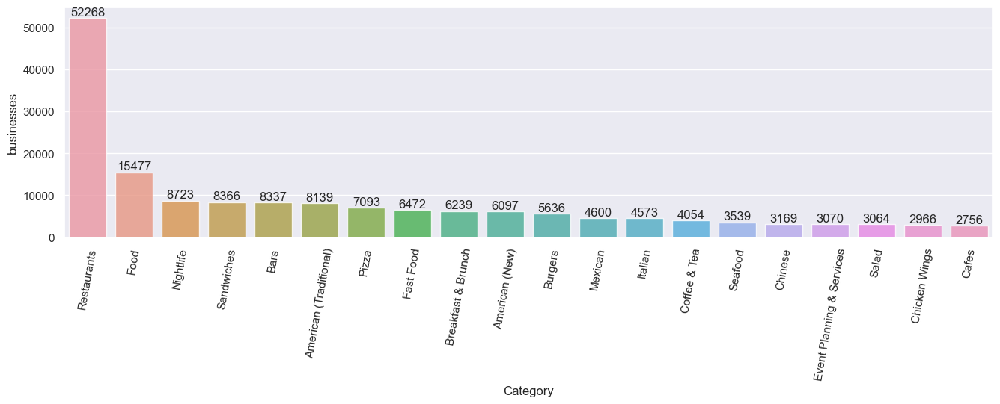

In [46]:
business=business.dropna(subset=['categories'])
business_cats=','.join(business['categories'])

words=business_cats.split(',')
for i in range(len(words)):
    words[i]=words[i].strip()
cats=pd.DataFrame(words,columns=['category'])

x=cats.category.value_counts()
print("There are ",len(x)," different types/categories of Businesses in Yelp!")
#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[0:20]

#chart
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8)#,color=color[5])
# plt.title("What are the top categories?",fontsize=25)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [25]:
# pd.read_json("C:\\Users\\vjjh\\Desktop\\data science\\final project\\yelp_academic_dataset_checkin.json\\yelp_academic_dataset_checkin.json",lines=True,encoding="UTF-8")

In [26]:
# pd.read_json("C:\\Users\\vjjh\\Desktop\\data science\\final project\\yelp_academic_dataset_tip.json\\yelp_academic_dataset_tip.json",lines=True,encoding="UTF-8")

In [27]:
# pd.read_json("C:\\Users\\vjjh\\Desktop\\data science\\final project\\yelp_academic_dataset_user.json\\yelp_academic_dataset_user.json",lines=True,encoding="UTF-8")